In [22]:
import pandas as pd
import torch
import random
import numpy as np
import torch.nn as nn
from torch.nn.utils.rnn import pad_sequence
from sklearn.model_selection import KFold
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Sampler

df = pd.read_csv("../data/csr_embeddings_leq2019_filled_citation_count_cpc_lagged.csv")

## Seed

In [23]:
def set_seed(seed=42):
    random.seed(seed) # 控制 Python 內建的 random 模組（例如 random.shuffle()、random.randint()）。
    np.random.seed(seed) # 控制 NumPy 所有隨機操作（例如 np.random.rand()、np.random.shuffle()）。
    torch.manual_seed(seed) # 控制 CPU 上 PyTorch 的隨機性（例如 torch.rand()）。
    torch.cuda.manual_seed(seed)  # for CUDA
    torch.cuda.manual_seed_all(seed)  # for multi-GPU

    torch.backends.cudnn.deterministic = True  # 強制使用 deterministic（確定性）版本的 CuDNN 操作，避免某些 kernel 造成非一致性輸出。
    torch.backends.cudnn.benchmark = False     # 關閉 CuDNN 根據輸入自動選最佳演算法的機制，避免因選到不同 kernel 而有不同結果。

set_seed(42)

In [24]:
df

,file_name,dim_0,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,...,dim_1018,dim_1019,dim_1020,dim_1021,dim_1022,dim_1023,ticker,year,total_5yr_forward_citations,patents_count
0,NASDAQ_AAPL_2014,-0.091830,0.293040,-0.179719,0.083607,-0.032453,0.012720,-0.027948,0.030055,0.105388,...,0.290067,-0.223406,-0.325722,0.009091,-0.170071,0.163041,AAPL,2014,901.0,123.0
1,NASDAQ_AAPL_2015,-0.085034,0.276596,-0.139275,0.068203,-0.015527,-0.055515,-0.033100,0.032737,0.124428,...,0.292318,-0.212523,-0.331629,-0.030166,-0.150414,0.180043,AAPL,2015,809.0,96.0
2,NASDAQ_AAPL_2016,-0.067159,0.277524,-0.148442,0.092723,-0.000616,-0.040362,-0.032554,0.009260,0.143966,...,0.296767,-0.216122,-0.327691,-0.037364,-0.151454,0.178229,AAPL,2016,404.0,89.0
3,NASDAQ_AAPL_2017,-0.053141,0.259755,-0.160064,0.098964,-0.006857,-0.001506,-0.052370,0.012755,0.146752,...,0.284501,-0.213012,-0.317366,-0.034005,-0.147262,0.175490,AAPL,2017,193.0,29.0
4,NASDAQ_AAPL_2018,-0.070878,0.338528,-0.095608,0.093072,-0.027314,-0.033892,-0.052765,0.021670,0.055076,...,0.274357,-0.190008,-0.347579,-0.004540,-0.125971,0.124562,AAPL,2018,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,NYSE_XRX_2017,-0.116771,0.273073,0.085469,-0.172837,-0.261041,-0.295415,-0.034079,0.221862,0.033038,...,0.342520,-0.213148,-0.552106,-0.062122,-0.010183,0.144048,XRX,2017,0.0,0.0
1595,NYSE_XRX_2018,-0.120495,0.256214,-0.124283,-0.008754,-0.040228,0.083673,-0.134553,-0.033440,0.127288,...,0.347586,-0.078939,-0.259030,0.024605,-0.203625,0.167591,XRX,2018,0.0,0.0
1596,NYSE_XRX_2019,-0.107306,0.273209,-0.103959,-0.001074,-0.034088,0.069932,-0.120183,-0.036632,0.132176,...,0.369505,-0.079411,-0.255776,0.003702,-0.204953,0.158863,XRX,2019,0.0,0.0
1597,NYSE_XYL_2018,-0.128076,0.242467,-0.105685,-0.002712,-0.121495,0.049107,-0.150115,0.002445,0.126636,...,0.374914,-0.140273,-0.278945,-0.068210,-0.167383,0.143690,XYL,2018,0.0,0.0


## Dataset

In [25]:
# target y 欄位
y_cols = ['patents_count', 'total_5yr_forward_citations']

# Step 1: 計算原始資料的 mean 和 std
y_mean_array = df[y_cols].mean().values  # shape: (2,)
y_std_array = df[y_cols].std().values    # shape: (2,)

# Step 2: 先進行標準化（Z-score）
y_raw = df[y_cols].values
y_standardized = (y_raw - y_mean_array) / y_std_array

# Step 3: 針對每個欄位找出標準化後的最小值
y_min_per_col = y_standardized.min(axis=0)  # shape: (2,)

# Step 4: 為了讓最小值為 0，建立 shift_array
shift_array = -y_min_per_col

# Step 5: 儲存轉換後的 y（可選）
df[[f'{col}_stdshift' for col in y_cols]] = y_standardized + shift_array

In [26]:
class SlidingWindowDatasetMax5(torch.utils.data.Dataset):
    def __init__(self, df, company_list, max_len=5):
        self.samples = []

        # 篩選指定公司資料
        df = df[df['ticker'].isin(company_list)].copy()

        for company_id, group in df.groupby('ticker'):
            group = group.sort_values('year').reset_index(drop=True)

            years = group['year'].values
            x_all = torch.tensor(group[[f'dim_{i}' for i in range(1024)]].values, dtype=torch.float32)

            # ✅ 對 y 做標準化並平移（std + shift）
            y_all = group[y_cols].values                          # 原始 y
            y_all = (y_all - y_mean_array) / y_std_array         # Z-score
            y_all = y_all + shift_array                          # shift 最小值為 0
            y_all = torch.tensor(y_all, dtype=torch.float32)     # 轉為 tensor

            # 建立滑動視窗資料（時間順序）
            for end in range(len(group)):
                start = max(0, end - max_len + 1)  # 控制最大長度為 max_len
                x_seq = x_all[start:end+1]         # 輸入序列
                y_seq = y_all[end]                 # 預測目標為當期 y
                y_year = years[end]

                self.samples.append({
                    'x_seq': x_seq,
                    'y_seq': y_seq,
                    'ticker': company_id,
                    'y_year': y_year,
                    'index': f"{company_id}_{years[start]}_{y_year}"
                })

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample = self.samples[idx]
        return sample['x_seq'], sample['y_seq'], sample['ticker'], sample['y_year'], sample['index']

## Unormalize

In [27]:
def unnormalize_shifted(tensor, mean_array, std_array, shift_array):
    return ((tensor - shift_array) * std_array) + mean_array

## Model

In [28]:
class LSTM_MTL_Stepwise(nn.Module):
    def __init__(self, input_dim=1024, hidden_dim=256, head_dim=32):
        super().__init__()
        self.lstm_cell = nn.LSTMCell(input_dim, hidden_dim)

        # Shared Sequential Layer
        self.shared_head = nn.Sequential(
            nn.Linear(hidden_dim, head_dim),
            nn.ReLU(),
            nn.Dropout(0.5),
        )
        
        # Head for patents_count
        self.head_count = nn.Sequential(
            nn.Linear(head_dim, 1),
            # nn.ReLU()
        )
        
        # Head for citations
        self.head_citation = nn.Sequential(
            nn.Linear(head_dim, 1),
            # nn.ReLU()
        )

    def forward(self, x, lengths):  
        B, T_max, D = x.shape
        
        h = torch.zeros(B, 256, device=x.device)
        c = torch.zeros(B, 256, device=x.device)
        
        # 逐步累積所有時間步的 h，最後根據每筆資料的真實長度從 h_all 中動態取出對應的最後有效 h（而非直接取 T_max），避免 padding 影響
        h_list = []

        for t in range(T_max):
            h, c = self.lstm_cell(x[:, t, :], (h, c))
            h_list.append(h.unsqueeze(1))  # [B, 1, H]

        h_all = torch.cat(h_list, dim=1)  # [B, T_max, H]

        # 使用 batch 索引直接取出每筆資料最後有效步驟的 h
        batch_indices = torch.arange(B, device=x.device)
        last_h = h_all[batch_indices, lengths - 1, :]  # [B, H]

        # 先經過 shared head 256 ➔ 32
        shared_out = self.shared_head(last_h)  # [B, 32]

        y1 = self.head_count(shared_out)
        y2 = self.head_citation(shared_out)

        return torch.cat([y1, y2], dim=1)  # [B, 2]

## Evaluation metrics

In [29]:
# --- Metrics (Z-score + shift 還原版) ---
def compute_metrics(y_pred, y_true):
    y_pred = y_pred.cpu().numpy()
    y_true = y_true.cpu().numpy()
    metrics = {}

    # 還原 count 和 citation 預測值
    y_pred[:, 0] = unnormalize_shifted(y_pred[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
    y_true[:, 0] = unnormalize_shifted(y_true[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])

    y_pred[:, 1] = unnormalize_shifted(y_pred[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
    y_true[:, 1] = unnormalize_shifted(y_true[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

    for i, name in enumerate(["count", "citation"]):
        y_p, y_t = y_pred[:, i], y_true[:, i]
        mse = np.mean((y_p - y_t) ** 2)
        mae = np.mean(np.abs(y_p - y_t))
        rmse = np.sqrt(mse)
        smape = np.mean(2 * np.abs(y_p - y_t) / (np.abs(y_p) + np.abs(y_t) + 1e-8)) * 100
        metrics[name] = {"MSE": mse, "MAE": mae, "RMSE": rmse, "SMAPE": smape}

    return metrics

## Loss function

In [30]:
class MSEPunishLoss(nn.Module):
    def __init__(self, alpha=1.0, punish_mode='', return_each=False):
        """
        :param alpha: 懲罰項權重
        :param punish_mode: 'abs', 'square', 'binary', 'huber', 'ratio', 'threshold'
        :param return_each: 是否回傳 count loss 和 citation loss
        """
        super().__init__()
        self.mse = nn.MSELoss()
        self.alpha = alpha
        self.punish_mode = punish_mode
        self.return_each = return_each

    def forward(self, preds, targets):
        pred_count, pred_citation = preds[:, 0], preds[:, 1]
        true_count, true_citation = targets[:, 0], targets[:, 1]

        loss_count = self.mse(pred_count, true_count)
        loss_citation = self.mse(pred_citation, true_citation)
        loss_total = loss_count + loss_citation

        # Initialize punishment
        punishment = 0.0

        if self.punish_mode:
            mask = (true_count == 0)
            if mask.sum() > 0:
                if self.punish_mode == 'abs':
                    punishment = torch.sum(torch.abs(pred_citation[mask]))
                elif self.punish_mode == 'square':
                    punishment = torch.sum((pred_citation[mask]) ** 2)
                elif self.punish_mode == 'binary':
                    punishment = torch.sum((pred_citation[mask] > 1e-4).float())
                elif self.punish_mode == 'huber':
                    punishment = nn.functional.smooth_l1_loss(
                        pred_citation[mask],
                        torch.zeros_like(pred_citation[mask]),
                        reduction='sum'
                    )
                elif self.punish_mode == 'ratio':
                    safe_count = true_count + 1e-6
                    ratio = pred_citation / safe_count
                    punishment = torch.sum(ratio[mask])
                elif self.punish_mode == 'threshold':
                    threshold = 1.0
                    over = torch.clamp(pred_citation[mask] - threshold, min=0)
                    punishment = torch.sum(over)
                else:
                    raise ValueError(f"Unsupported punish_mode: {self.punish_mode}")

        loss_total = loss_total + self.alpha * punishment

        if self.return_each:
            return loss_total, loss_count.item(), loss_citation.item()
        else:
            return loss_total

## StratifiedKFold

In [31]:
from sklearn.model_selection import StratifiedKFold

company_df = df.groupby('ticker')[['patents_count', 'total_5yr_forward_citations']].mean().reset_index()

# Step 1: 建立 count 是否為 0 的 flag
company_df['has_patents'] = (company_df['patents_count'] > 0).astype(int)

# Step 2: 對 citation 進行分箱（只對有產出的公司分）
bins = [-1, 0, 10, 50, 200, np.inf]
company_df['citation_bin'] = pd.cut(company_df['total_5yr_forward_citations'], bins=bins, labels=False)

# Step 3: 建立綜合 stratify 標籤
# 沒有產出的公司統一為 0，有產出者根據 citation_bin 分層
company_df['stratify_label'] = company_df.apply(
    lambda row: 0 if row['has_patents'] == 0 else row['citation_bin'] + 1,
    axis=1
)

stratified_kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

folds = []
for train_idx, test_idx in stratified_kf.split(company_df['ticker'], company_df['stratify_label']):
    train_coms = company_df.iloc[train_idx]['ticker'].values
    test_coms = company_df.iloc[test_idx]['ticker'].values
    folds.append((train_coms, test_coms))


/home/francia/anaconda3/envs/csr_env/lib/python3.10/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


In [32]:
for i, (_, test_coms) in enumerate(folds):
    sub_df = df[df['ticker'].isin(test_coms)]

    # Citation 統計
    mean_cit = sub_df['total_5yr_forward_citations'].mean()
    std_cit = sub_df['total_5yr_forward_citations'].std()
    max_cit = sub_df['total_5yr_forward_citations'].max()

    # Count 統計
    mean_cnt = sub_df['patents_count'].mean()
    std_cnt = sub_df['patents_count'].std()
    max_cnt = sub_df['patents_count'].max()

    # 無專利公司比例
    company_level = sub_df.groupby('ticker')['patents_count'].sum().reset_index()
    no_patent_ratio = (company_level['patents_count'] == 0).mean() * 100

    print(f"[Fold {i+1}]")
    print(f"  Citation → mean: {mean_cit:.2f} | std: {std_cit:.2f} | max: {max_cit:.2f}")
    print(f"  Count    → mean: {mean_cnt:.2f} | std: {std_cnt:.2f} | max: {max_cnt:.2f}")
    print(f"  % Companies with NO patents: {no_patent_ratio:.1f}%")

[Fold 1]
  Citation → mean: 28.43 | std: 129.45 | max: 1929.00
  Count    → mean: 3.34 | std: 9.73 | max: 71.00
  % Companies with NO patents: 55.7%
[Fold 2]
  Citation → mean: 56.22 | std: 271.42 | max: 2880.00
  Count    → mean: 3.83 | std: 19.08 | max: 160.00
  % Companies with NO patents: 55.7%
[Fold 3]
  Citation → mean: 46.06 | std: 216.93 | max: 2519.00
  Count    → mean: 6.64 | std: 27.14 | max: 243.00
  % Companies with NO patents: 55.7%
[Fold 4]
  Citation → mean: 47.49 | std: 187.40 | max: 1594.00
  Count    → mean: 7.29 | std: 33.81 | max: 312.00
  % Companies with NO patents: 55.0%
[Fold 5]
  Citation → mean: 17.05 | std: 75.65 | max: 969.00
  Count    → mean: 3.24 | std: 16.85 | max: 255.00
  % Companies with NO patents: 56.7%


## Evaluate best model

In [33]:
def evaluate_best_model(model, val_loader, fold_id, best_epoch):
    """
    Evaluate the best model on the validation set, returning predictions, true labels, and metadata.
    """
    model.eval()
    all_preds = []
    all_y = []
    val_meta_info = []

    with torch.no_grad():
        for batch_id, batch in enumerate(val_loader):
            x_seqs, y_seqs, tickers, y_years, indices = zip(*batch)
            lengths = torch.tensor([x.shape[0] for x in x_seqs]).to(next(model.parameters()).device)
            x_seqs = pad_sequence(x_seqs, batch_first=True).to(next(model.parameters()).device)
            y_seqs = torch.stack(y_seqs).to(next(model.parameters()).device)

            preds = model(x_seqs, lengths)

            all_preds.append(preds.cpu())
            all_y.append(y_seqs.cpu())

            for i, index in enumerate(indices):
                val_meta_info.append({
                    "fold": fold_id + 1,
                    "epoch": best_epoch + 1,
                    "batch": batch_id + 1,
                    "sample": i,
                    "index": index
                })

    return [torch.cat(all_preds)], [torch.cat(all_y)], [val_meta_info]


## Training

In [34]:
## Training
# --- Training Config ---
## 5-fold Cross Validation
company_ids = df['ticker'].unique()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

epochs = 100
# learning_rate = 1e-3
learning_rate = 1e-4

# 初始化儲存所有 fold 的 loss
all_train_losses_total, all_train_losses_count, all_train_losses_citation = [], [], []
all_train_preds_total, all_train_targets_total, all_train_meta_info_total = [], [], []

all_val_losses_count, all_val_losses_citation ,all_val_losses_total = [], [], []
all_val_preds_total, all_val_targets_total, all_val_meta_info_total = [], [], []

best_epoch_list = []

for fold_id, (train_coms, test_coms) in enumerate(folds):
    print(f"\n====== Fold {fold_id+1} ======")

    fold_train_preds_epochs, fold_train_targets_epochs, fold_train_meta_epochs = [], [], []
    fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = [], [], []
    
    # Dataset   
    train_dataset = SlidingWindowDatasetMax5(df, train_coms)
    test_dataset = SlidingWindowDatasetMax5(df, test_coms)

    generator = torch.Generator().manual_seed(42)

    # DataLoader
    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, collate_fn=lambda x: x, generator=generator)
    val_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: x)

    # Model
    model = LSTM_MTL_Stepwise().to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)
    criterion = MSEPunishLoss(alpha=1.0, punish_mode='', return_each=True)

    # 儲存每個 epoch 的 loss（每 fold 一份）
    train_loss_total_list, train_loss_count_list, train_loss_citation_list = [], [], []
    val_loss_total_list, val_loss_count_list, val_loss_citation_list = [], [], []

    # <-- Early Stopping 初始化 -->
    best_val_loss = float('inf')
    epochs_no_improve = 0
    patience = 50
    best_model_state = None
    best_epoch = None  

    for epoch in range(epochs):
        model.train()
        epoch_losses, epoch_loss_count_all, epoch_loss_citation_all = [], [], []
        train_preds, train_targets, train_meta_info = [], [], []
        for batch_id, batch in enumerate(train_loader):
            x_seqs, y_seqs, tickers, y_years, indices = zip(*batch)
            lengths = torch.tensor([x.shape[0] for x in x_seqs]).to(device)
            x_seqs = pad_sequence(x_seqs, batch_first=True).to(device)
            y_seqs = torch.stack(y_seqs).to(device)

            preds = model(x_seqs, lengths)

            loss_total, loss_count, loss_citation = criterion(preds, y_seqs)
            optimizer.zero_grad()
            loss_total.backward()
            optimizer.step()

            epoch_losses.append(loss_total.item())
            epoch_loss_count_all.append(loss_count)
            epoch_loss_citation_all.append(loss_citation)

            train_preds.append(preds.detach().cpu())
            train_targets.append(y_seqs.detach().cpu())

            for i, index in enumerate(indices):
                train_meta_info.append({
                    "fold": fold_id + 1,
                    "epoch": epoch + 1,
                    "batch": batch_id + 1,
                    "sample": i,
                    "index": index
                })

            # # ✔ 每個 batch 印 loss、predictions、truth
            # print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Train][Batch] Company: {tickers[0]} | Samples: {len(indices)}")
            # print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
            # print(f"  Predictions (expm1, rounded): {np.round(torch.expm1(preds).detach().cpu().numpy())}")
            # print(f"  Ground truth (expm1, rounded): {np.round(torch.expm1(y_seqs).detach().cpu().numpy())}")
            # print(f"  Indices: {indices}")

        avg_train_loss = np.mean(epoch_losses)
        avg_train_count = np.mean(epoch_loss_count_all)
        avg_train_citation = np.mean(epoch_loss_citation_all)

        train_loss_total_list.append(avg_train_loss)
        train_loss_count_list.append(avg_train_count)
        train_loss_citation_list.append(avg_train_citation)

        fold_train_meta_epochs.append(train_meta_info)
        fold_train_preds_epochs.append(torch.cat(train_preds))
        fold_train_targets_epochs.append(torch.cat(train_targets))

        # Validation
        model.eval()
        with torch.no_grad():
            val_losses = []
            val_loss_count_all = []
            val_loss_citation_all = []
            all_preds = []
            all_y = []
            val_meta_info = []  # <--- 新增：本 epoch 的 meta 資訊
            for batch_id, batch in enumerate(val_loader):
                x_seqs, y_seqs, tickers, y_years, indices = zip(*batch)
                lengths = torch.tensor([x.shape[0] for x in x_seqs]).to(device)
                x_seqs = pad_sequence(x_seqs, batch_first=True).to(device)
                y_seqs = torch.stack(y_seqs).to(device)

                preds = model(x_seqs, lengths)
                loss_total, loss_count, loss_citation = criterion(preds, y_seqs)
                
                val_losses.append(loss_total.item())
                val_loss_count_all.append(loss_count)
                val_loss_citation_all.append(loss_citation)

                all_preds.append(preds)
                all_y.append(y_seqs)

                # 💾 新增：記錄每一筆的 fold / epoch / batch / sample index
                for i, index in enumerate(indices):
                    val_meta_info.append({
                        "fold": fold_id + 1,
                        "epoch": epoch + 1,
                        "batch": batch_id + 1,
                        "sample": i,
                        "index": index
                    })

                # ===  還原 ===
                pred_np = preds.detach().cpu().numpy()
                true_np = y_seqs.detach().cpu().numpy()

                # ✅ 正確還原 count（index 0）與 citation（index 1）
                pred_np[:, 0] = unnormalize_shifted(pred_np[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
                true_np[:, 0] = unnormalize_shifted(true_np[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])

                pred_np[:, 1] = unnormalize_shifted(pred_np[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
                true_np[:, 1] = unnormalize_shifted(true_np[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

                # ✔ 每個 batch 印 loss、predictions、truth
                print(f"[Fold {fold_id+1}][Epoch {epoch+1}][Val][Batch] Company: {tickers[0]} | Samples: {len(indices)}")
                print(f"  Total Loss: {loss_total.item():.4f} | Count Loss: {loss_count:.4f} | Citation Loss: {loss_citation:.4f}")
                print(f"  Predictions (min-max restored, rounded): {np.round(pred_np)}")
                print(f"  Ground truth (min-max restored, rounded): {np.round(true_np)}")
                print(f"  Indices: {indices}")

            fold_val_preds_epochs.append(torch.cat(all_preds).cpu())
            fold_val_targets_epochs.append(torch.cat(all_y).cpu())
            fold_val_meta_epochs.append(val_meta_info)

            avg_val_loss = np.mean(val_losses)
            avg_val_count = np.mean(val_loss_count_all)
            avg_val_citation = np.mean(val_loss_citation_all)

            val_loss_total_list.append(avg_val_loss)
            val_loss_count_list.append(avg_val_count)
            val_loss_citation_list.append(avg_val_citation)

            all_preds = torch.cat(all_preds)
            all_y = torch.cat(all_y)

            # ✔ 每個 epoch 最後 summary
            print(f"[Fold {fold_id+1}][Epoch {epoch+1}] Summary")
            print(f"  Train Avg Loss     -> Total: {avg_train_loss:.4f} | Count: {avg_train_count:.4f} | Citation: {avg_train_citation:.4f}")
            print(f"  Validation Avg Loss-> Total: {avg_val_loss:.4f} | Count: {avg_val_count:.4f} | Citation: {avg_val_citation:.4f}")

        metrics = compute_metrics(all_preds, all_y)
        for name, vals in metrics.items():
            print(f"  [{name.upper()}] Metrics -> MSE: {vals['MSE']:.4f} | MAE: {vals['MAE']:.4f} | "
                f"RMSE: {vals['RMSE']:.4f} | SMAPE: {vals['SMAPE']:.2f}%")
            
        # <-- Early Stopping 判斷 -->
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            best_model_state = model.state_dict()
            best_epoch = epoch
            print(f"  ✅ Validation loss improved. Saving model.")
        else:
            epochs_no_improve += 1
            print(f"  ❌ No improvement. Patience: {epochs_no_improve}/{patience}")

        if epochs_no_improve >= patience:
            print(f"  ⏹ Early stopping triggered at epoch {epoch+1}. Best val_loss: {best_val_loss:.4f}")
            break
        print(f"  🔄 Best model loaded from epoch {best_epoch}")

    # 還原最佳模型狀態（可選）
    if best_model_state is not None:
        # 有早停（代表中途有最佳模型）
        model.load_state_dict(best_model_state)
        print("  🔄 Best model loaded for final evaluation or saving.")
        fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = evaluate_best_model(
            model, val_loader, fold_id, best_epoch
        )
    else:
        # 沒有早停（跑滿 epochs），此時就保留最後一輪模型，照樣 evaluate
        print("  ⚠️ No best model found. Using final epoch model for evaluation.")
        fold_val_preds_epochs, fold_val_targets_epochs, fold_val_meta_epochs = evaluate_best_model(
            model, val_loader, fold_id, epoch  # 此時 epoch 就是最後一輪 index
        )

    # 每個 fold 儲存進總表中
    all_train_losses_total.append(train_loss_total_list)
    all_train_losses_count.append(train_loss_count_list)
    all_train_losses_citation.append(train_loss_citation_list)

    all_train_preds_total.append(fold_train_preds_epochs)
    all_train_targets_total.append(fold_train_targets_epochs)
    all_train_meta_info_total.append(fold_train_meta_epochs)

    all_val_losses_total.append(val_loss_total_list)
    all_val_losses_count.append(val_loss_count_list)
    all_val_losses_citation.append(val_loss_citation_list)

    all_val_preds_total.append(fold_val_preds_epochs)
    all_val_targets_total.append(fold_val_targets_epochs)
    all_val_meta_info_total.append(fold_val_meta_epochs)

    best_epoch_list.append(best_epoch + 1 if best_epoch is not None else epochs)


====== Fold 1 ======
[Fold 1][Epoch 1][Val][Batch] Company: ACCO | Samples: 16
  Total Loss: 0.0767 | Count Loss: 0.0460 | Citation Loss: 0.0307
  Predictions (min-max restored, rounded): [[ 4. 29.]
 [ 5. 29.]
 [ 5. 30.]
 [ 5. 31.]
 [ 5. 35.]
 [ 6. 38.]
 [ 6. 39.]
 [ 6. 40.]
 [ 6. 38.]
 [ 6. 38.]
 [ 6. 38.]
 [ 5. 36.]
 [ 5. 30.]
 [ 5. 31.]
 [ 5. 32.]
 [ 5. 34.]]
  Ground truth (min-max restored, rounded): [[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [1. 2.]
 [1. 5.]
 [1. 1.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [2. 4.]
 [0. 0.]
 [0. 0.]]
  Indices: ('ACCO_2017_2017', 'ACCO_2017_2018', 'ACCO_2017_2019', 'ACN_2011_2011', 'ACN_2011_2012', 'ACN_2011_2013', 'ACN_2011_2014', 'ACN_2011_2015', 'ACN_2012_2016', 'ACN_2013_2017', 'ACN_2014_2018', 'ACN_2015_2019', 'ADM_2014_2014', 'ADM_2014_2015', 'ADM_2014_2016', 'ADM_2014_2017')
[Fold 1][Epoch 1][Val][Batch] Company: ADM | Samples: 16
  Total Loss: 0.0822 | Count Loss: 0.0543 | Citation Loss: 0.0279
  Predictions (min-max restored, ro

## compute_sample_metrics

In [35]:
def compute_sample_metrics(y_true, y_pred):
    abs_error = np.abs(y_pred - y_true)
    squared_error = (y_pred - y_true) ** 2
    rmse_error = np.sqrt(squared_error)
    smape_error = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)

    return {
        "count_MSE": squared_error[:, 0],
        "count_MAE": abs_error[:, 0],
        "count_RMSE": rmse_error[:, 0],
        "count_SMAPE": smape_error[:, 0],
        "citation_MSE": squared_error[:, 1],
        "citation_MAE": abs_error[:, 1],
        "citation_RMSE": rmse_error[:, 1],
        "citation_SMAPE": smape_error[:, 1],
    }

# Save validation result to csv

In [36]:
val_summary_records, train_summary_records = [], []

for fold_id in range(len(folds)):
    fold_preds = all_val_preds_total[fold_id][0]
    fold_targets = all_val_targets_total[fold_id][0]
    fold_meta_info = all_val_meta_info_total[fold_id][0]

    # min-max 還原
    y_pred = fold_preds.numpy()
    y_true = fold_targets.numpy()

    # 還原 count 和 citation
    y_pred[:, 0] = unnormalize_shifted(y_pred[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
    y_true[:, 0] = unnormalize_shifted(y_true[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
    y_pred[:, 1] = unnormalize_shifted(y_pred[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
    y_true[:, 1] = unnormalize_shifted(y_true[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

    metrics = compute_sample_metrics(y_true, y_pred)

    for i, meta in enumerate(fold_meta_info):
        val_summary_records.append({
            "fold": meta["fold"],
            "epoch": meta["epoch"],
            "batch": meta["batch"],
            "local_sample": meta["sample"],
            "index": meta["index"],
            "val_true_count": round(y_true[i, 0], 4),
            "val_pred_count": round(y_pred[i, 0], 4),
            "val_true_citation": round(y_true[i, 1], 4),
            "val_pred_citation": round(y_pred[i, 1], 4),
            "val_count_MSE": round(metrics["count_MSE"][i], 4),
            "val_count_MAE": round(metrics["count_MAE"][i], 4),
            "val_count_SMAPE": round(metrics["count_SMAPE"][i], 4),
            "val_citation_MSE": round(metrics["citation_MSE"][i], 4),
            "val_citation_MAE": round(metrics["citation_MAE"][i], 4),
            "val_citation_SMAPE": round(metrics["citation_SMAPE"][i], 4),
            # train 留空
            "train_true_count": np.nan,
            "train_pred_count": np.nan,
            "train_true_citation": np.nan,
            "train_pred_citation": np.nan,
            "train_loss_total": np.nan,
            "train_loss_count": np.nan,
            "train_loss_citation": np.nan,
            "train_count_MSE": np.nan,
            "train_count_MAE": np.nan,
            "train_count_SMAPE": np.nan,
            "train_citation_MSE": np.nan,
            "train_citation_MAE": np.nan,
            "train_citation_SMAPE": np.nan,
        })

    # === Training ===
    for epoch in range(len(all_train_preds_total[fold_id])):
        fold_preds = all_train_preds_total[fold_id][epoch].cpu()
        fold_targets = all_train_targets_total[fold_id][epoch].cpu()
        fold_meta_info = all_train_meta_info_total[fold_id][epoch]

        # 還原 count 和 citation
        fold_preds[:, 0] = unnormalize_shifted(fold_preds[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
        fold_targets[:, 0] = unnormalize_shifted(fold_targets[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
        fold_preds[:, 1] = unnormalize_shifted(fold_preds[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
        fold_targets[:, 1] = unnormalize_shifted(fold_targets[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

        metrics = compute_sample_metrics(fold_targets, fold_preds)

        for i, meta in enumerate(fold_meta_info):
            train_summary_records.append({
                "fold": meta["fold"],
                "epoch": meta["epoch"],
                "batch": meta["batch"],
                "local_sample": meta["sample"],
                "index": meta["index"],
                # val 留空
                "val_true_count": np.nan,
                "val_pred_count": np.nan,
                "val_true_citation": np.nan,
                "val_pred_citation": np.nan,
                "val_loss_total": np.nan,
                "val_loss_count": np.nan,
                "val_loss_citation": np.nan,
                "val_count_MSE": np.nan,
                "val_count_MAE": np.nan,
                "val_count_SMAPE": np.nan,
                "val_citation_MSE": np.nan,
                "val_citation_MAE": np.nan,
                "val_citation_SMAPE": np.nan,
                # train 留資料
                "train_true_count": round(fold_targets[i, 0].item(), 4),
                "train_pred_count": round(fold_preds[i, 0].item(), 4),
                "train_true_citation": round(fold_targets[i, 1].item(), 4),
                "train_pred_citation": round(fold_preds[i, 1].item(), 4),
                "train_count_MSE": round(metrics["count_MSE"][i].item(), 4),
                "train_count_MAE": round(metrics["count_MAE"][i].item(), 4),
                "train_count_SMAPE": round(metrics["count_SMAPE"][i].item(), 4),
                "train_citation_MSE": round(metrics["citation_MSE"][i].item(), 4),
                "train_citation_MAE": round(metrics["citation_MAE"][i].item(), 4),
                "train_citation_SMAPE": round(metrics["citation_SMAPE"][i].item(), 4),
            })


# 儲存 CSV
val_summary_df = pd.DataFrame(val_summary_records)
train_summary_df = pd.DataFrame(train_summary_records)
val_summary_df.to_csv("../output/lstm_mtl_csr_embedding_v3_std_val_detailed.csv", index=False)
combined_df = pd.concat([val_summary_df, train_summary_df], ignore_index=True)
combined_df.to_csv("../output/lstm_mtl_csr_embedding_v3_std_train_val_detailed.csv", index=False)
print("✅ Saved detailed validation results to 'train_val_detailed.csv'")

/tmp/ipykernel_913750/269634022.py:2: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  abs_error = np.abs(y_pred - y_true)
/tmp/ipykernel_913750/269634022.py:4: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  rmse_error = np.sqrt(squared_error)
/tmp/ipykernel_913750/269634022.py:5: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  smape_error = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)
/tmp/ipykernel_913750/1219930256.py:106: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat opera

✅ Saved detailed validation results to 'train_val_detailed.csv'


In [37]:
print("\n====== Final Summary: Each Fold's Avg Loss (per Y) ======")
for fold_id in range(len(folds)):
    avg_train_count = np.mean(all_train_losses_count[fold_id])
    avg_train_citation = np.mean(all_train_losses_citation[fold_id])
    avg_val_count = np.mean(all_val_losses_count[fold_id])
    avg_val_citation = np.mean(all_val_losses_citation[fold_id])
    
    print(f"[Fold {fold_id+1}]")
    print(f"  Train  -> Count Loss: {avg_train_count:.4f} | Citation Loss: {avg_train_citation:.4f}")
    print(f"  Valid  -> Count Loss: {avg_val_count:.4f} | Citation Loss: {avg_val_citation:.4f}")

# 全部 fold 加總平均
mean_train_count = np.mean([np.mean(x) for x in all_train_losses_count])
mean_train_citation = np.mean([np.mean(x) for x in all_train_losses_citation])
mean_val_count = np.mean([np.mean(x) for x in all_val_losses_count])
mean_val_citation = np.mean([np.mean(x) for x in all_val_losses_citation])

print("\n====== Final Overall Avg Loss Across 5 Folds ======")
print(f"Train  -> Count Loss: {mean_train_count:.4f} | Citation Loss: {mean_train_citation:.4f}")
print(f"Valid  -> Count Loss: {mean_val_count:.4f} | Citation Loss: {mean_val_citation:.4f}")



====== Final Summary: Each Fold's Avg Loss (per Y) ======
[Fold 1]
  Train  -> Count Loss: 0.4606 | Citation Loss: 0.7076
  Valid  -> Count Loss: 0.2460 | Citation Loss: 0.3281
[Fold 2]
  Train  -> Count Loss: 0.4189 | Citation Loss: 0.3468
  Valid  -> Count Loss: 0.4834 | Citation Loss: 1.8671
[Fold 3]
  Train  -> Count Loss: 0.4389 | Citation Loss: 0.6667
  Valid  -> Count Loss: 1.2069 | Citation Loss: 1.0916
[Fold 4]
  Train  -> Count Loss: 0.3544 | Citation Loss: 0.7176
  Valid  -> Count Loss: 1.9026 | Citation Loss: 0.7650
[Fold 5]
  Train  -> Count Loss: 0.4595 | Citation Loss: 0.7899
  Valid  -> Count Loss: 0.5403 | Citation Loss: 0.1790

====== Final Overall Avg Loss Across 5 Folds ======
Train  -> Count Loss: 0.4264 | Citation Loss: 0.6457
Valid  -> Count Loss: 0.8758 | Citation Loss: 0.8462


In [38]:
import numpy as np
import torch

# 合併所有 fold 的預測與 meta 資訊
y_pred_all = torch.cat([torch.cat(fold) for fold in all_val_preds_total])
y_true_all = torch.cat([torch.cat(fold) for fold in all_val_targets_total])
meta_all = [meta for fold in all_val_meta_info_total for epoch in fold for meta in epoch]

# 還原到原始空間
y_pred = y_pred_all.numpy()
y_true = y_true_all.numpy()

# 還原 count 和 citation
y_pred[:, 0] = unnormalize_shifted(y_pred[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_true[:, 0] = unnormalize_shifted(y_true[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_pred[:, 1] = unnormalize_shifted(y_pred[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
y_true[:, 1] = unnormalize_shifted(y_true[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

# 計算每筆樣本的誤差
abs_error = np.abs(y_pred - y_true)
squared_error = (y_pred - y_true) ** 2
rmse_error = np.sqrt(squared_error)
smape = 2 * abs_error / (np.abs(y_pred) + np.abs(y_true) + 1e-8)

# 印出所有資料（可改成 range(50) 減少輸出）
print("\n===== Detailed Per-Sample Metric with Meta Info =====")
for i in range(len(y_true)):
    meta = meta_all[i]
    print(f"\n[Sample {i}] [Fold {meta['fold']}][Epoch {meta['epoch']}][Batch {meta['batch']}][Local Sample {meta['sample']}] Index: {meta['index']}")
    print(f"  COUNT    -> True: {y_true[i, 0]:.2f}, Pred: {y_pred[i, 0]:.2f}")
    print(f"              MSE: {squared_error[i, 0]:.4f}, MAE: {abs_error[i, 0]:.4f}, RMSE: {rmse_error[i, 0]:.4f}, SMAPE: {smape[i, 0]*100:.2f}%")
    print(f"  CITATION -> True: {y_true[i, 1]:.2f}, Pred: {y_pred[i, 1]:.2f}")
    print(f"              MSE: {squared_error[i, 1]:.4f}, MAE: {abs_error[i, 1]:.4f}, RMSE: {rmse_error[i, 1]:.4f}, SMAPE: {smape[i, 1]*100:.2f}%")



===== Detailed Per-Sample Metric with Meta Info =====

[Sample 0] [Fold 1][Epoch 29][Batch 1][Local Sample 0] Index: ACCO_2017_2017
  COUNT    -> True: 0.00, Pred: 17.09
              MSE: 292.1924, MAE: 17.0936, RMSE: 17.0936, SMAPE: 200.00%
  CITATION -> True: 0.00, Pred: 1753.30
              MSE: 3074056.2500, MAE: 1753.2987, RMSE: 1753.2987, SMAPE: 200.00%

[Sample 1] [Fold 1][Epoch 29][Batch 1][Local Sample 1] Index: ACCO_2017_2018
  COUNT    -> True: 0.00, Pred: 9.55
              MSE: 91.2427, MAE: 9.5521, RMSE: 9.5521, SMAPE: 200.00%
  CITATION -> True: 0.00, Pred: 1393.03
              MSE: 1940540.8750, MAE: 1393.0330, RMSE: 1393.0330, SMAPE: 200.00%

[Sample 2] [Fold 1][Epoch 29][Batch 1][Local Sample 2] Index: ACCO_2017_2019
  COUNT    -> True: 0.00, Pred: 19.23
              MSE: 369.8090, MAE: 19.2304, RMSE: 19.2304, SMAPE: 200.00%
  CITATION -> True: 0.00, Pred: 2089.01
              MSE: 4363952.5000, MAE: 2089.0076, RMSE: 2089.0076, SMAPE: 200.00%

[Sample 3] [Fold 1

In [39]:
import numpy as np
import torch

# 合併預測與標籤
y_pred_all = torch.cat([tensor for fold in all_val_preds_total for tensor in fold])
y_true_all = torch.cat([tensor for fold in all_val_targets_total for tensor in fold])

# 還原到原始空間
y_pred = y_pred_all.numpy()
y_true = y_true_all.numpy()

# 還原 count 和 citation
y_pred[:, 0] = unnormalize_shifted(y_pred[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_true[:, 0] = unnormalize_shifted(y_true[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_pred[:, 1] = unnormalize_shifted(y_pred[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
y_true[:, 1] = unnormalize_shifted(y_true[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

# 計算每一筆的誤差
abs_error = np.abs(y_pred - y_true)            # shape: [N, 2]
squared_error = (y_pred - y_true) ** 2         # shape: [N, 2]
smape_numerator = 2 * abs_error
smape_denominator = np.abs(y_pred) + np.abs(y_true) + 1e-8
smape_error = smape_numerator / smape_denominator  # shape: [N, 2]

# 逐筆記錄
count_metrics = {
    "MSE": squared_error[:, 0],
    "MAE": abs_error[:, 0],
    "RMSE": np.sqrt(squared_error[:, 0]),
    "SMAPE": smape_error[:, 0]
}

citation_metrics = {
    "MSE": squared_error[:, 1],
    "MAE": abs_error[:, 1],
    "RMSE": np.sqrt(squared_error[:, 1]),
    "SMAPE": smape_error[:, 1]
}

def show_top_k(metric_dict, metric_name, topk=10):
    print(f"\n===== Top {topk} Samples by {metric_name} =====")
    for task, values in metric_dict.items():
        top_idx = np.argsort(values)[-topk:][::-1]
        print(f"\n>>> {metric_name} - {task.upper()}")
        for i in top_idx:
            print(f"[Sample {i}] {task}: {values[i]:.4f} | True: {y_true[i, 0 if task=='COUNT' else 1]:.2f}, Pred: {y_pred[i, 0 if task=='COUNT' else 1]:.2f}")

# 包裝成 COUNT / CITATION 標籤
count_named = {k: v for k, v in count_metrics.items()}
citation_named = {k: v for k, v in citation_metrics.items()}

# 展示各個 metric 中貢獻最大的樣本
for metric_name in ["MSE", "MAE", "RMSE", "SMAPE"]:
    show_top_k({
        "COUNT": count_named[metric_name],
        "CITATION": citation_named[metric_name]
    }, metric_name)



===== Top 10 Samples by MSE =====

>>> MSE - COUNT
[Sample 1122] COUNT: 48114964.0000 | True: 7181.06, Pred: 244.57
[Sample 1123] COUNT: 44052428.0000 | True: 6881.85, Pred: 244.65
[Sample 1398] COUNT: 33960096.0000 | True: 5869.14, Pred: 41.61
[Sample 796] COUNT: 21187968.0000 | True: 5592.94, Pred: 989.90
[Sample 1124] COUNT: 19308274.0000 | True: 4649.28, Pred: 255.16
[Sample 1121] COUNT: 18540984.0000 | True: 4695.31, Pred: 389.38
[Sample 792] COUNT: 14391928.0000 | True: 4649.28, Pred: 855.61
[Sample 1125] COUNT: 11174200.0000 | True: 3590.53, Pred: 247.75
[Sample 797] COUNT: 9536139.0000 | True: 4027.84, Pred: 939.77
[Sample 858] COUNT: 8284292.0000 | True: 391.28, Pred: 3269.52

>>> MSE - CITATION
[Sample 445] CITATION: 304481173504.0000 | True: 554346.12, Pred: 2547.99
[Sample 444] CITATION: 177785241600.0000 | True: 423843.81, Pred: 2197.93
[Sample 792] CITATION: 174802010112.0000 | True: 484860.38, Pred: 66767.07
[Sample 446] CITATION: 128937238528.0000 | True: 361672.34, Pr

# Draw

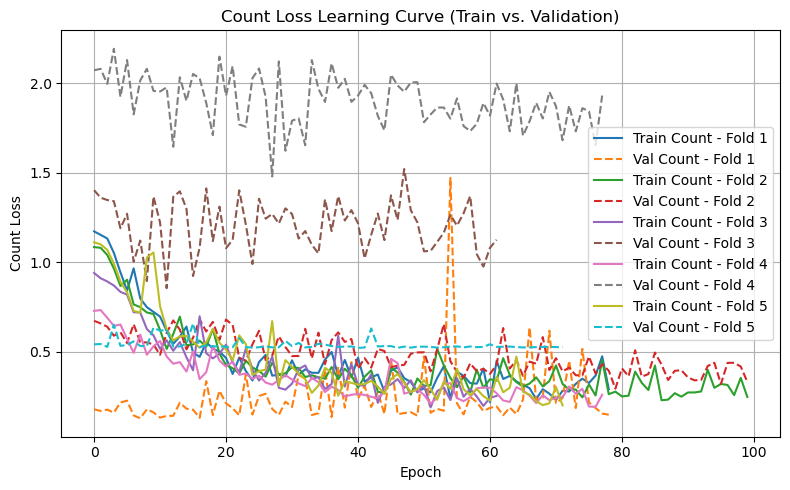

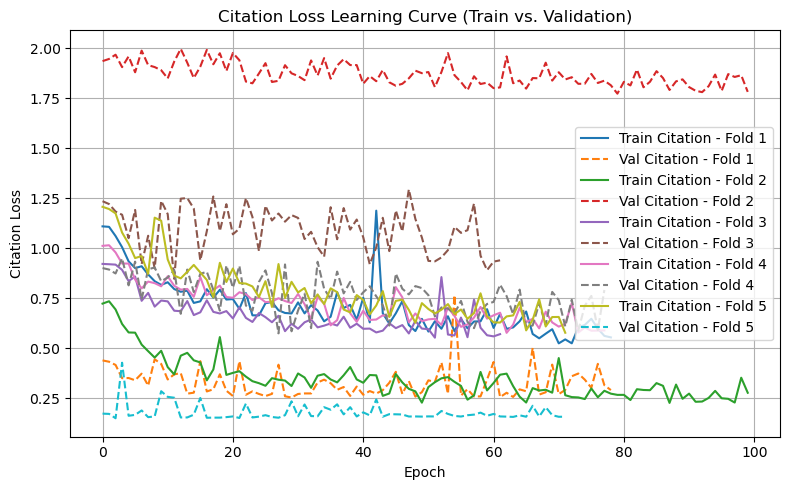

In [40]:
import matplotlib.pyplot as plt

# Count Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_count[fold_id], label=f"Train Count - Fold {fold_id+1}")
    plt.plot(all_val_losses_count[fold_id], label=f"Val Count - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Count Loss")
plt.title("Count Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Citation Loss Learning Curve
plt.figure(figsize=(8, 5))
for fold_id in range(5):
    plt.plot(all_train_losses_citation[fold_id], label=f"Train Citation - Fold {fold_id+1}")
    plt.plot(all_val_losses_citation[fold_id], label=f"Val Citation - Fold {fold_id+1}", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Citation Loss")
plt.title("Citation Loss Learning Curve (Train vs. Validation)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


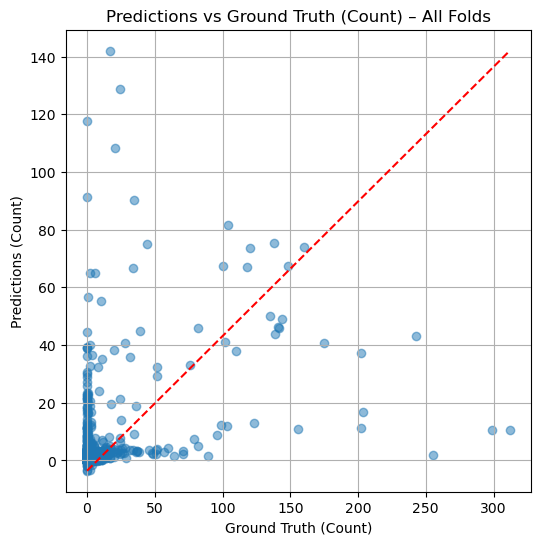

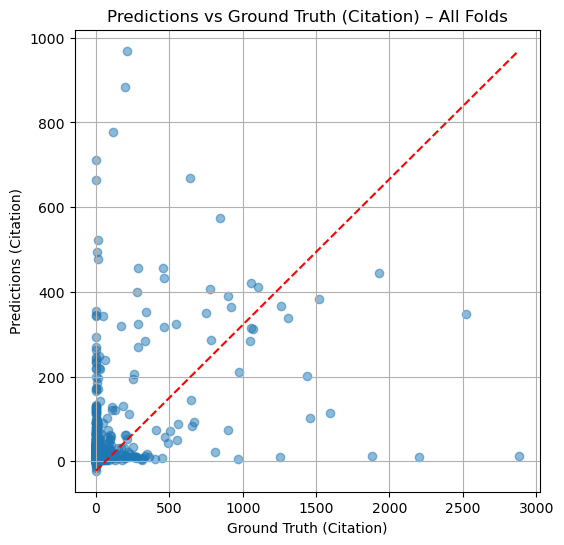

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# 合併所有驗證資料
y_pred_all = torch.cat([tensor for fold in all_val_preds_total for tensor in fold])
y_true_all = torch.cat([tensor for fold in all_val_targets_total for tensor in fold])

y_pred_all = y_pred_all.numpy()
y_true_all = y_true_all.numpy()

# 還原 count 和 citation
y_pred[:, 0] = unnormalize_shifted(y_pred[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_true[:, 0] = unnormalize_shifted(y_true[:, 0], y_mean_array[0], y_std_array[0], shift_array[0])
y_pred[:, 1] = unnormalize_shifted(y_pred[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])
y_true[:, 1] = unnormalize_shifted(y_true[:, 1], y_mean_array[1], y_std_array[1], shift_array[1])

# Count 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 0], y_pred_all[:, 0], alpha=0.5)
plt.plot([y_true_all[:, 0].min(), y_true_all[:, 0].max()],
         [y_pred_all[:, 0].min(), y_pred_all[:, 0].max()], 'r--')
plt.xlabel("Ground Truth (Count)")
plt.ylabel("Predictions (Count)")
plt.title("Predictions vs Ground Truth (Count) – All Folds")
plt.grid(True)
plt.show()

# Citation 圖
plt.figure(figsize=(6, 6))
plt.scatter(y_true_all[:, 1], y_pred_all[:, 1], alpha=0.5)
plt.plot([y_true_all[:, 1].min(), y_true_all[:, 1].max()],
         [y_pred_all[:, 1].min(), y_pred_all[:, 1].max()], 'r--')
plt.xlabel("Ground Truth (Citation)")
plt.ylabel("Predictions (Citation)")
plt.title("Predictions vs Ground Truth (Citation) – All Folds")
plt.grid(True)
plt.show()


In [42]:
print(f"Total number of samples: {y_true_all.shape[0]}")

Total number of samples: 1599
